# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

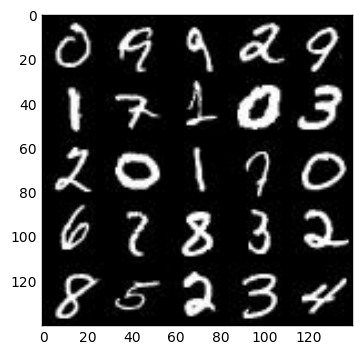

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

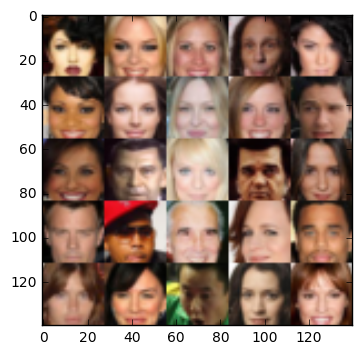

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, [None, z_dim], name='inputs_z')
    lr = tf.placeholder(tf.float32, None)

    return inputs_real, inputs_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.2
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=False if is_train==True else True):
        alpha = 0.2
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
     # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [15]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
        
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
        
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    steps = 0
    print_every = 10
    show_every = 100
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # rescale to pass to D
                batch_images *= 2.0
                
                # Get input noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                if steps % show_every == 0:
                    show_generator_output(sess, batch_size, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.3131... Generator Loss: 3.2342
Epoch 1/2... Discriminator Loss: 1.1885... Generator Loss: 1.7640
Epoch 1/2... Discriminator Loss: 2.2038... Generator Loss: 1.9239
Epoch 1/2... Discriminator Loss: 1.3628... Generator Loss: 0.6919
Epoch 1/2... Discriminator Loss: 1.2301... Generator Loss: 0.5688
Epoch 1/2... Discriminator Loss: 1.4688... Generator Loss: 0.4501
Epoch 1/2... Discriminator Loss: 1.1850... Generator Loss: 0.6612
Epoch 1/2... Discriminator Loss: 1.2444... Generator Loss: 0.5436
Epoch 1/2... Discriminator Loss: 1.4221... Generator Loss: 0.6379
Epoch 1/2... Discriminator Loss: 1.0844... Generator Loss: 0.7283


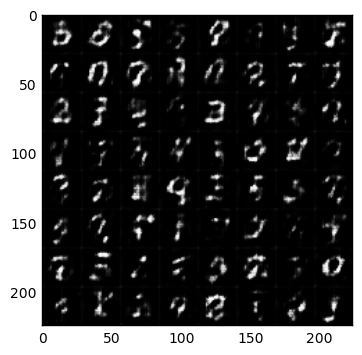

Epoch 1/2... Discriminator Loss: 1.2416... Generator Loss: 0.7330
Epoch 1/2... Discriminator Loss: 1.0174... Generator Loss: 1.2042
Epoch 1/2... Discriminator Loss: 1.1049... Generator Loss: 0.6255
Epoch 1/2... Discriminator Loss: 1.1641... Generator Loss: 0.5539
Epoch 1/2... Discriminator Loss: 1.8959... Generator Loss: 0.3120
Epoch 1/2... Discriminator Loss: 1.6824... Generator Loss: 0.8055
Epoch 1/2... Discriminator Loss: 1.0839... Generator Loss: 0.6173
Epoch 1/2... Discriminator Loss: 1.0206... Generator Loss: 0.8029
Epoch 1/2... Discriminator Loss: 2.2514... Generator Loss: 0.1516
Epoch 1/2... Discriminator Loss: 1.1201... Generator Loss: 0.7796


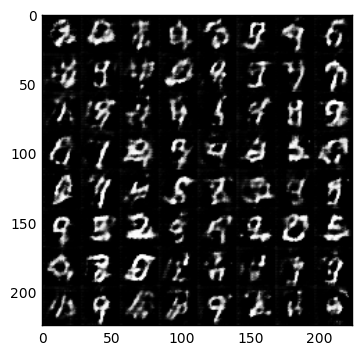

Epoch 1/2... Discriminator Loss: 1.5889... Generator Loss: 1.4902
Epoch 1/2... Discriminator Loss: 1.6716... Generator Loss: 1.5098
Epoch 1/2... Discriminator Loss: 1.3063... Generator Loss: 0.8863
Epoch 1/2... Discriminator Loss: 1.2164... Generator Loss: 0.9241
Epoch 1/2... Discriminator Loss: 1.6351... Generator Loss: 1.5282
Epoch 1/2... Discriminator Loss: 1.2737... Generator Loss: 1.3512
Epoch 1/2... Discriminator Loss: 1.7046... Generator Loss: 0.2748
Epoch 1/2... Discriminator Loss: 1.5961... Generator Loss: 0.2985
Epoch 1/2... Discriminator Loss: 1.6500... Generator Loss: 0.3219
Epoch 1/2... Discriminator Loss: 1.1017... Generator Loss: 0.8697


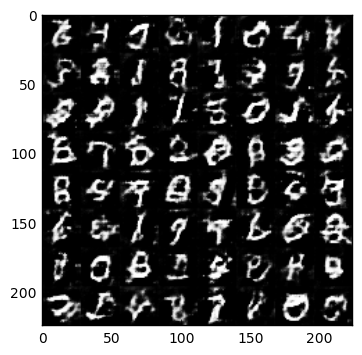

Epoch 1/2... Discriminator Loss: 1.1526... Generator Loss: 0.6924
Epoch 1/2... Discriminator Loss: 1.4378... Generator Loss: 1.5607
Epoch 1/2... Discriminator Loss: 1.1757... Generator Loss: 1.0938
Epoch 1/2... Discriminator Loss: 1.1481... Generator Loss: 0.6667
Epoch 1/2... Discriminator Loss: 1.3466... Generator Loss: 0.5375
Epoch 1/2... Discriminator Loss: 1.0739... Generator Loss: 0.8357
Epoch 1/2... Discriminator Loss: 1.2130... Generator Loss: 0.6887
Epoch 1/2... Discriminator Loss: 1.3562... Generator Loss: 1.5173
Epoch 1/2... Discriminator Loss: 1.4036... Generator Loss: 1.7016
Epoch 1/2... Discriminator Loss: 1.2769... Generator Loss: 0.4970


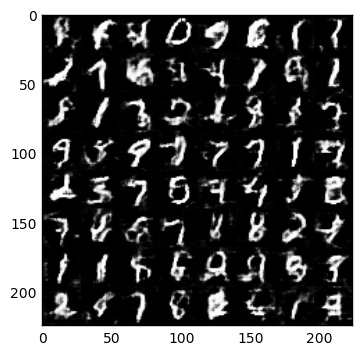

Epoch 1/2... Discriminator Loss: 1.0039... Generator Loss: 0.9641
Epoch 1/2... Discriminator Loss: 1.1642... Generator Loss: 1.3080
Epoch 1/2... Discriminator Loss: 1.1206... Generator Loss: 1.2088
Epoch 1/2... Discriminator Loss: 1.3721... Generator Loss: 0.3976
Epoch 1/2... Discriminator Loss: 1.1534... Generator Loss: 0.9016
Epoch 1/2... Discriminator Loss: 1.4776... Generator Loss: 1.6442
Epoch 1/2... Discriminator Loss: 1.1867... Generator Loss: 1.4646
Epoch 1/2... Discriminator Loss: 1.5917... Generator Loss: 0.2921
Epoch 1/2... Discriminator Loss: 1.1298... Generator Loss: 0.8754
Epoch 1/2... Discriminator Loss: 1.1695... Generator Loss: 1.5014


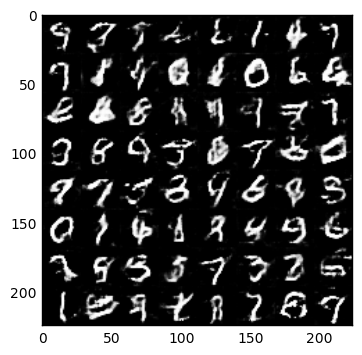

Epoch 1/2... Discriminator Loss: 1.1374... Generator Loss: 0.6400
Epoch 1/2... Discriminator Loss: 0.8747... Generator Loss: 1.5349
Epoch 1/2... Discriminator Loss: 1.0374... Generator Loss: 0.7854
Epoch 1/2... Discriminator Loss: 0.9714... Generator Loss: 0.7865
Epoch 1/2... Discriminator Loss: 1.0571... Generator Loss: 1.0053
Epoch 1/2... Discriminator Loss: 1.3389... Generator Loss: 0.4189
Epoch 1/2... Discriminator Loss: 1.0662... Generator Loss: 0.6616
Epoch 1/2... Discriminator Loss: 0.9174... Generator Loss: 1.1126
Epoch 1/2... Discriminator Loss: 1.7882... Generator Loss: 0.2662
Epoch 1/2... Discriminator Loss: 0.9989... Generator Loss: 0.9453


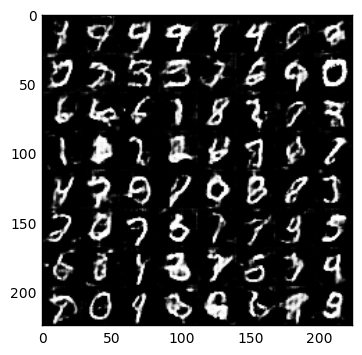

Epoch 1/2... Discriminator Loss: 1.7980... Generator Loss: 0.2641
Epoch 1/2... Discriminator Loss: 0.9336... Generator Loss: 0.9847
Epoch 1/2... Discriminator Loss: 1.7461... Generator Loss: 0.2722
Epoch 1/2... Discriminator Loss: 0.9335... Generator Loss: 0.9995
Epoch 1/2... Discriminator Loss: 1.8415... Generator Loss: 0.2393
Epoch 1/2... Discriminator Loss: 1.1028... Generator Loss: 0.6278
Epoch 1/2... Discriminator Loss: 0.9479... Generator Loss: 1.9433
Epoch 1/2... Discriminator Loss: 1.2681... Generator Loss: 0.7193
Epoch 1/2... Discriminator Loss: 1.0547... Generator Loss: 0.7350
Epoch 1/2... Discriminator Loss: 1.1795... Generator Loss: 0.5427


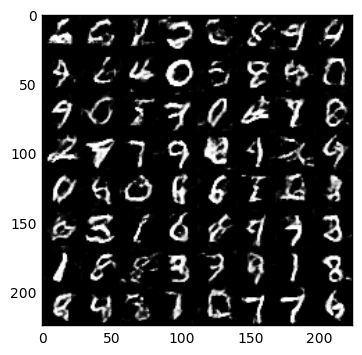

Epoch 1/2... Discriminator Loss: 1.3034... Generator Loss: 1.2152
Epoch 1/2... Discriminator Loss: 0.9740... Generator Loss: 0.8100
Epoch 1/2... Discriminator Loss: 0.9224... Generator Loss: 1.4648
Epoch 1/2... Discriminator Loss: 1.5041... Generator Loss: 1.9869
Epoch 1/2... Discriminator Loss: 0.9299... Generator Loss: 0.9348
Epoch 1/2... Discriminator Loss: 1.1814... Generator Loss: 0.5402
Epoch 1/2... Discriminator Loss: 0.8948... Generator Loss: 1.4721
Epoch 1/2... Discriminator Loss: 1.4670... Generator Loss: 0.4228
Epoch 1/2... Discriminator Loss: 1.1420... Generator Loss: 0.6268
Epoch 1/2... Discriminator Loss: 0.6658... Generator Loss: 1.7307


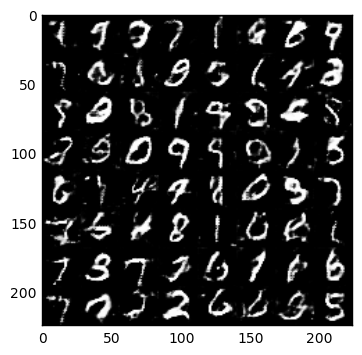

Epoch 1/2... Discriminator Loss: 0.7648... Generator Loss: 1.9433
Epoch 1/2... Discriminator Loss: 0.4980... Generator Loss: 1.8886
Epoch 1/2... Discriminator Loss: 1.8827... Generator Loss: 0.2750
Epoch 1/2... Discriminator Loss: 1.1320... Generator Loss: 1.2438
Epoch 1/2... Discriminator Loss: 1.5970... Generator Loss: 0.3743
Epoch 1/2... Discriminator Loss: 1.1500... Generator Loss: 0.5551
Epoch 1/2... Discriminator Loss: 1.2115... Generator Loss: 0.5226
Epoch 1/2... Discriminator Loss: 1.2329... Generator Loss: 0.6157
Epoch 1/2... Discriminator Loss: 1.2695... Generator Loss: 0.5025
Epoch 1/2... Discriminator Loss: 1.0974... Generator Loss: 0.6574


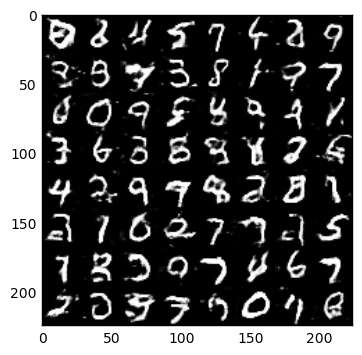

Epoch 1/2... Discriminator Loss: 0.9165... Generator Loss: 0.8848
Epoch 1/2... Discriminator Loss: 0.7278... Generator Loss: 1.3365
Epoch 1/2... Discriminator Loss: 0.8202... Generator Loss: 1.7363
Epoch 2/2... Discriminator Loss: 1.8105... Generator Loss: 0.2395
Epoch 2/2... Discriminator Loss: 0.8904... Generator Loss: 0.8419
Epoch 2/2... Discriminator Loss: 2.3484... Generator Loss: 0.1369
Epoch 2/2... Discriminator Loss: 1.6426... Generator Loss: 0.4764
Epoch 2/2... Discriminator Loss: 1.0997... Generator Loss: 0.7055
Epoch 2/2... Discriminator Loss: 0.6517... Generator Loss: 1.1741
Epoch 2/2... Discriminator Loss: 1.2066... Generator Loss: 0.5228


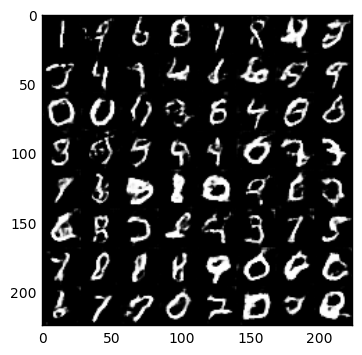

Epoch 2/2... Discriminator Loss: 1.1507... Generator Loss: 3.0511
Epoch 2/2... Discriminator Loss: 0.7064... Generator Loss: 1.7122
Epoch 2/2... Discriminator Loss: 0.7376... Generator Loss: 1.0290
Epoch 2/2... Discriminator Loss: 1.3752... Generator Loss: 3.9442
Epoch 2/2... Discriminator Loss: 0.6571... Generator Loss: 1.4433
Epoch 2/2... Discriminator Loss: 1.2727... Generator Loss: 0.4970
Epoch 2/2... Discriminator Loss: 1.3018... Generator Loss: 0.4893
Epoch 2/2... Discriminator Loss: 0.4227... Generator Loss: 1.5465
Epoch 2/2... Discriminator Loss: 0.4265... Generator Loss: 1.6460
Epoch 2/2... Discriminator Loss: 0.2240... Generator Loss: 2.4983


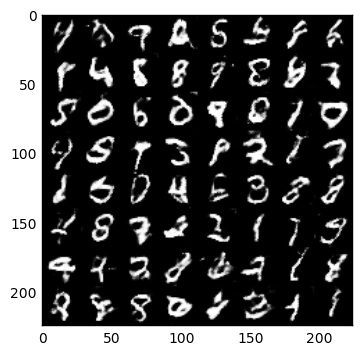

Epoch 2/2... Discriminator Loss: 0.9411... Generator Loss: 1.8575
Epoch 2/2... Discriminator Loss: 1.4821... Generator Loss: 2.1564
Epoch 2/2... Discriminator Loss: 1.0995... Generator Loss: 1.6074
Epoch 2/2... Discriminator Loss: 1.0916... Generator Loss: 0.7764
Epoch 2/2... Discriminator Loss: 0.8015... Generator Loss: 0.9209
Epoch 2/2... Discriminator Loss: 0.8951... Generator Loss: 1.6534
Epoch 2/2... Discriminator Loss: 0.8133... Generator Loss: 2.0621
Epoch 2/2... Discriminator Loss: 0.5463... Generator Loss: 1.6871
Epoch 2/2... Discriminator Loss: 1.6446... Generator Loss: 0.3885
Epoch 2/2... Discriminator Loss: 0.8875... Generator Loss: 0.8234


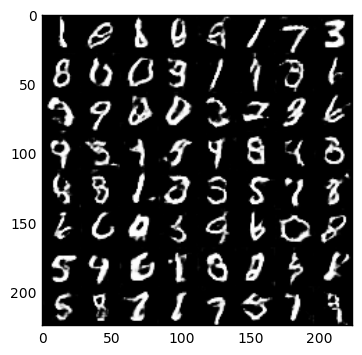

Epoch 2/2... Discriminator Loss: 0.8699... Generator Loss: 0.8613
Epoch 2/2... Discriminator Loss: 0.3355... Generator Loss: 2.2074
Epoch 2/2... Discriminator Loss: 0.8881... Generator Loss: 0.9079
Epoch 2/2... Discriminator Loss: 0.3661... Generator Loss: 1.9052
Epoch 2/2... Discriminator Loss: 3.8912... Generator Loss: 7.2654
Epoch 2/2... Discriminator Loss: 0.8647... Generator Loss: 1.2624
Epoch 2/2... Discriminator Loss: 0.5619... Generator Loss: 1.7638
Epoch 2/2... Discriminator Loss: 0.3752... Generator Loss: 1.7194
Epoch 2/2... Discriminator Loss: 0.6734... Generator Loss: 1.1064
Epoch 2/2... Discriminator Loss: 0.3447... Generator Loss: 1.6873


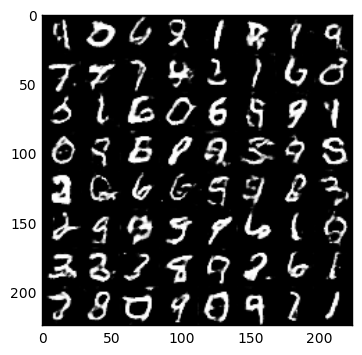

Epoch 2/2... Discriminator Loss: 0.3624... Generator Loss: 1.9337
Epoch 2/2... Discriminator Loss: 0.7957... Generator Loss: 2.0823
Epoch 2/2... Discriminator Loss: 0.5868... Generator Loss: 1.4900
Epoch 2/2... Discriminator Loss: 0.7428... Generator Loss: 1.0100
Epoch 2/2... Discriminator Loss: 0.5723... Generator Loss: 1.2300
Epoch 2/2... Discriminator Loss: 0.5908... Generator Loss: 1.3002
Epoch 2/2... Discriminator Loss: 0.8887... Generator Loss: 0.8259
Epoch 2/2... Discriminator Loss: 1.8532... Generator Loss: 0.4401
Epoch 2/2... Discriminator Loss: 0.9262... Generator Loss: 0.8339
Epoch 2/2... Discriminator Loss: 1.8968... Generator Loss: 0.4692


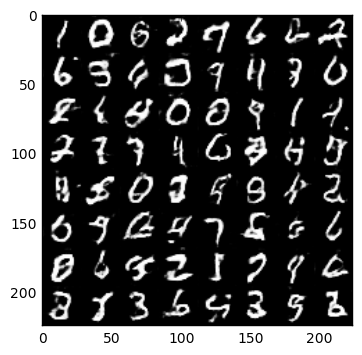

Epoch 2/2... Discriminator Loss: 1.0914... Generator Loss: 0.7457
Epoch 2/2... Discriminator Loss: 0.7714... Generator Loss: 1.0920
Epoch 2/2... Discriminator Loss: 0.8153... Generator Loss: 1.8916
Epoch 2/2... Discriminator Loss: 1.0656... Generator Loss: 3.4131
Epoch 2/2... Discriminator Loss: 0.8263... Generator Loss: 0.9900
Epoch 2/2... Discriminator Loss: 1.6602... Generator Loss: 0.4258
Epoch 2/2... Discriminator Loss: 0.9497... Generator Loss: 0.7532
Epoch 2/2... Discriminator Loss: 1.0406... Generator Loss: 0.6499
Epoch 2/2... Discriminator Loss: 0.6962... Generator Loss: 1.0692
Epoch 2/2... Discriminator Loss: 1.0737... Generator Loss: 0.6697


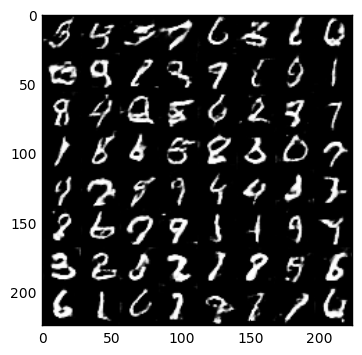

Epoch 2/2... Discriminator Loss: 0.5802... Generator Loss: 1.5236
Epoch 2/2... Discriminator Loss: 0.6064... Generator Loss: 1.3888
Epoch 2/2... Discriminator Loss: 0.6004... Generator Loss: 1.1644
Epoch 2/2... Discriminator Loss: 0.5160... Generator Loss: 1.2651
Epoch 2/2... Discriminator Loss: 0.7389... Generator Loss: 1.0381
Epoch 2/2... Discriminator Loss: 0.5540... Generator Loss: 1.3310
Epoch 2/2... Discriminator Loss: 0.4689... Generator Loss: 1.6276
Epoch 2/2... Discriminator Loss: 0.6971... Generator Loss: 1.1966
Epoch 2/2... Discriminator Loss: 0.7258... Generator Loss: 0.9796
Epoch 2/2... Discriminator Loss: 0.4453... Generator Loss: 1.6360


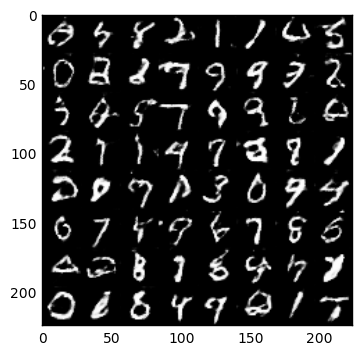

Epoch 2/2... Discriminator Loss: 0.2550... Generator Loss: 2.1992
Epoch 2/2... Discriminator Loss: 0.7244... Generator Loss: 1.7301
Epoch 2/2... Discriminator Loss: 0.4936... Generator Loss: 1.7185
Epoch 2/2... Discriminator Loss: 0.5127... Generator Loss: 3.8259
Epoch 2/2... Discriminator Loss: 0.5998... Generator Loss: 1.2581
Epoch 2/2... Discriminator Loss: 0.6504... Generator Loss: 3.3548
Epoch 2/2... Discriminator Loss: 0.4514... Generator Loss: 2.1809
Epoch 2/2... Discriminator Loss: 0.7223... Generator Loss: 1.1415
Epoch 2/2... Discriminator Loss: 0.6674... Generator Loss: 1.1746
Epoch 2/2... Discriminator Loss: 0.6408... Generator Loss: 1.2231


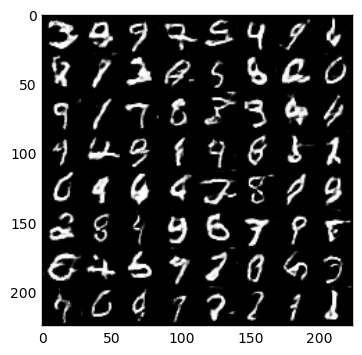

Epoch 2/2... Discriminator Loss: 0.6367... Generator Loss: 1.2970
Epoch 2/2... Discriminator Loss: 0.8146... Generator Loss: 1.0071
Epoch 2/2... Discriminator Loss: 6.9118... Generator Loss: 0.5313
Epoch 2/2... Discriminator Loss: 1.1397... Generator Loss: 0.6524
Epoch 2/2... Discriminator Loss: 0.4689... Generator Loss: 2.8156
Epoch 2/2... Discriminator Loss: 0.6451... Generator Loss: 1.1649
Epoch 2/2... Discriminator Loss: 0.8678... Generator Loss: 0.8765
Epoch 2/2... Discriminator Loss: 0.7177... Generator Loss: 1.3624
Epoch 2/2... Discriminator Loss: 0.7128... Generator Loss: 0.9875
Epoch 2/2... Discriminator Loss: 0.4695... Generator Loss: 1.7607


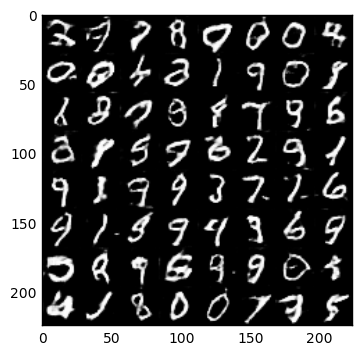

Epoch 2/2... Discriminator Loss: 0.6960... Generator Loss: 1.1037
Epoch 2/2... Discriminator Loss: 1.3196... Generator Loss: 0.6119
Epoch 2/2... Discriminator Loss: 0.5975... Generator Loss: 1.7170
Epoch 2/2... Discriminator Loss: 0.5239... Generator Loss: 1.5163
Epoch 2/2... Discriminator Loss: 0.6895... Generator Loss: 1.5420
Epoch 2/2... Discriminator Loss: 0.7614... Generator Loss: 1.1316
Epoch 2/2... Discriminator Loss: 0.7407... Generator Loss: 1.0142


In [16]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.1351... Generator Loss: 5.5667
Epoch 1/1... Discriminator Loss: 1.8694... Generator Loss: 0.4753
Epoch 1/1... Discriminator Loss: 2.7157... Generator Loss: 3.4787
Epoch 1/1... Discriminator Loss: 0.6127... Generator Loss: 3.3254
Epoch 1/1... Discriminator Loss: 0.6618... Generator Loss: 2.4046
Epoch 1/1... Discriminator Loss: 0.1768... Generator Loss: 3.8211
Epoch 1/1... Discriminator Loss: 8.6964... Generator Loss: 9.1390
Epoch 1/1... Discriminator Loss: 0.9139... Generator Loss: 0.9916
Epoch 1/1... Discriminator Loss: 1.3164... Generator Loss: 0.9776
Epoch 1/1... Discriminator Loss: 2.1770... Generator Loss: 0.1817


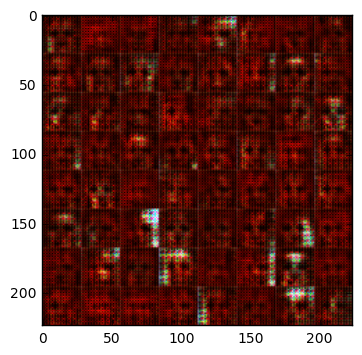

Epoch 1/1... Discriminator Loss: 0.2594... Generator Loss: 1.9593
Epoch 1/1... Discriminator Loss: 0.7475... Generator Loss: 1.2726
Epoch 1/1... Discriminator Loss: 0.3563... Generator Loss: 1.5811
Epoch 1/1... Discriminator Loss: 0.2971... Generator Loss: 1.8496
Epoch 1/1... Discriminator Loss: 0.0344... Generator Loss: 4.0013
Epoch 1/1... Discriminator Loss: 0.0639... Generator Loss: 3.1411
Epoch 1/1... Discriminator Loss: 0.0152... Generator Loss: 7.6926
Epoch 1/1... Discriminator Loss: 2.0085... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 0.9068... Generator Loss: 1.0447
Epoch 1/1... Discriminator Loss: 0.8885... Generator Loss: 1.2180


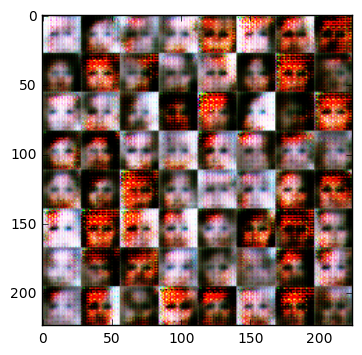

Epoch 1/1... Discriminator Loss: 2.3430... Generator Loss: 3.2702
Epoch 1/1... Discriminator Loss: 1.2163... Generator Loss: 0.8841
Epoch 1/1... Discriminator Loss: 1.2220... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 0.8840... Generator Loss: 1.3015
Epoch 1/1... Discriminator Loss: 1.0527... Generator Loss: 1.1616
Epoch 1/1... Discriminator Loss: 0.7729... Generator Loss: 1.8301
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.4363
Epoch 1/1... Discriminator Loss: 2.2971... Generator Loss: 0.1449
Epoch 1/1... Discriminator Loss: 2.0693... Generator Loss: 2.5366
Epoch 1/1... Discriminator Loss: 1.4887... Generator Loss: 1.9622


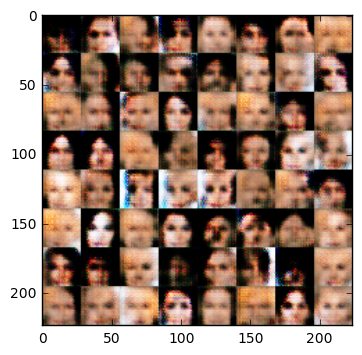

Epoch 1/1... Discriminator Loss: 2.2216... Generator Loss: 2.7849
Epoch 1/1... Discriminator Loss: 0.9049... Generator Loss: 1.1987
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.7924
Epoch 1/1... Discriminator Loss: 0.8368... Generator Loss: 0.8412
Epoch 1/1... Discriminator Loss: 1.1130... Generator Loss: 1.2996
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 0.7741
Epoch 1/1... Discriminator Loss: 1.4819... Generator Loss: 1.0963
Epoch 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 0.8085... Generator Loss: 1.3844
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 1.4299


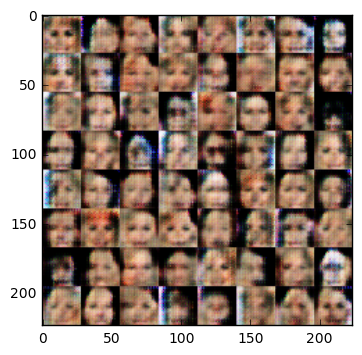

Epoch 1/1... Discriminator Loss: 1.5906... Generator Loss: 1.0239
Epoch 1/1... Discriminator Loss: 1.2515... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.9845
Epoch 1/1... Discriminator Loss: 1.4443... Generator Loss: 0.3609
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 1.0433
Epoch 1/1... Discriminator Loss: 0.6626... Generator Loss: 0.9000
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 1.0538
Epoch 1/1... Discriminator Loss: 0.7764... Generator Loss: 1.1688
Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 1.1819
Epoch 1/1... Discriminator Loss: 0.8317... Generator Loss: 2.1686


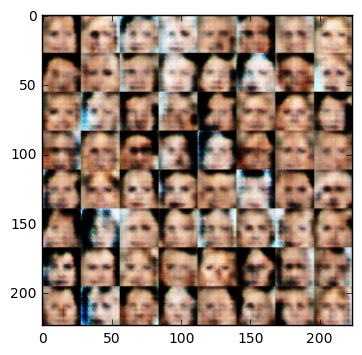

Epoch 1/1... Discriminator Loss: 0.6594... Generator Loss: 1.7604
Epoch 1/1... Discriminator Loss: 1.4381... Generator Loss: 0.6468
Epoch 1/1... Discriminator Loss: 1.2543... Generator Loss: 0.7262
Epoch 1/1... Discriminator Loss: 0.8757... Generator Loss: 1.2356
Epoch 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.6200
Epoch 1/1... Discriminator Loss: 1.1171... Generator Loss: 0.8838
Epoch 1/1... Discriminator Loss: 0.8845... Generator Loss: 1.9513
Epoch 1/1... Discriminator Loss: 0.7689... Generator Loss: 0.7563
Epoch 1/1... Discriminator Loss: 0.7764... Generator Loss: 1.7814
Epoch 1/1... Discriminator Loss: 0.8504... Generator Loss: 0.8103


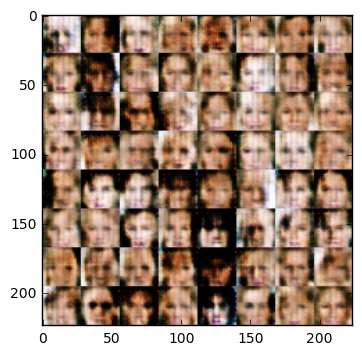

Epoch 1/1... Discriminator Loss: 0.9381... Generator Loss: 1.2531
Epoch 1/1... Discriminator Loss: 0.9695... Generator Loss: 2.3091
Epoch 1/1... Discriminator Loss: 1.5578... Generator Loss: 0.3708
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.4346
Epoch 1/1... Discriminator Loss: 1.5320... Generator Loss: 0.4162
Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.8038
Epoch 1/1... Discriminator Loss: 1.2418... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.7491


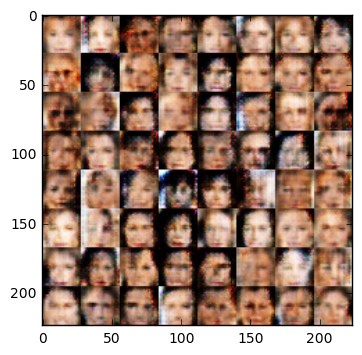

Epoch 1/1... Discriminator Loss: 1.4983... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.6185
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.4662
Epoch 1/1... Discriminator Loss: 0.9176... Generator Loss: 0.9839
Epoch 1/1... Discriminator Loss: 1.2546... Generator Loss: 1.0203
Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 0.7476
Epoch 1/1... Discriminator Loss: 0.8951... Generator Loss: 0.9430
Epoch 1/1... Discriminator Loss: 1.6680... Generator Loss: 0.5778
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.5873


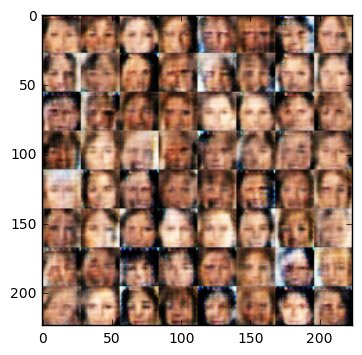

Epoch 1/1... Discriminator Loss: 1.4600... Generator Loss: 0.6177
Epoch 1/1... Discriminator Loss: 1.4534... Generator Loss: 0.9633
Epoch 1/1... Discriminator Loss: 1.4448... Generator Loss: 0.4990
Epoch 1/1... Discriminator Loss: 0.7736... Generator Loss: 0.9475
Epoch 1/1... Discriminator Loss: 0.6150... Generator Loss: 1.1103
Epoch 1/1... Discriminator Loss: 1.7907... Generator Loss: 0.2567
Epoch 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.8174
Epoch 1/1... Discriminator Loss: 1.2440... Generator Loss: 0.6319
Epoch 1/1... Discriminator Loss: 1.1197... Generator Loss: 0.7872
Epoch 1/1... Discriminator Loss: 1.1194... Generator Loss: 0.9660


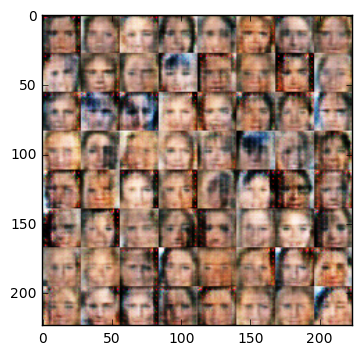

Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.6060
Epoch 1/1... Discriminator Loss: 1.4599... Generator Loss: 0.5166
Epoch 1/1... Discriminator Loss: 1.8434... Generator Loss: 0.2537
Epoch 1/1... Discriminator Loss: 0.4260... Generator Loss: 1.4774
Epoch 1/1... Discriminator Loss: 0.9936... Generator Loss: 0.8435
Epoch 1/1... Discriminator Loss: 1.6554... Generator Loss: 0.8077
Epoch 1/1... Discriminator Loss: 1.2832... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 1.5186... Generator Loss: 0.6403
Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 0.5860
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7664


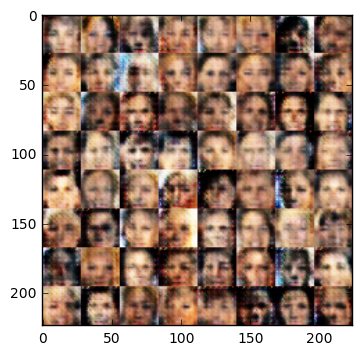

Epoch 1/1... Discriminator Loss: 1.4913... Generator Loss: 0.5281
Epoch 1/1... Discriminator Loss: 1.5453... Generator Loss: 0.5018
Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 0.9392
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.6343
Epoch 1/1... Discriminator Loss: 1.2946... Generator Loss: 0.6105
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.5933
Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.8159
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.6753
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.6546


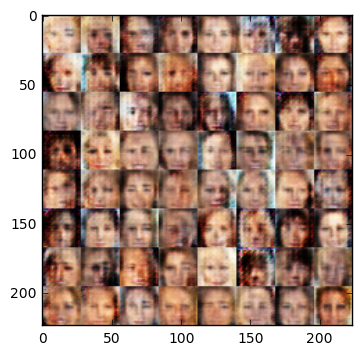

Epoch 1/1... Discriminator Loss: 1.4025... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.2534... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 1.5468... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.4609... Generator Loss: 0.5630
Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 0.5434
Epoch 1/1... Discriminator Loss: 1.1781... Generator Loss: 1.0939
Epoch 1/1... Discriminator Loss: 1.2357... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7476


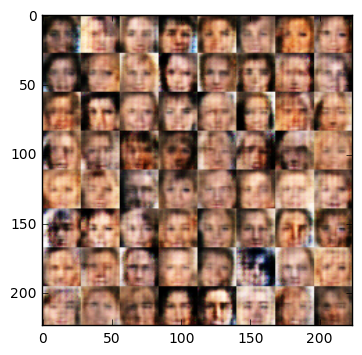

Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.9331
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.9833
Epoch 1/1... Discriminator Loss: 1.3606... Generator Loss: 0.4996
Epoch 1/1... Discriminator Loss: 1.0042... Generator Loss: 1.1926
Epoch 1/1... Discriminator Loss: 1.2101... Generator Loss: 1.0021
Epoch 1/1... Discriminator Loss: 0.8549... Generator Loss: 0.6732
Epoch 1/1... Discriminator Loss: 1.5815... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.2515... Generator Loss: 0.7952
Epoch 1/1... Discriminator Loss: 0.8876... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 0.8537... Generator Loss: 1.2202


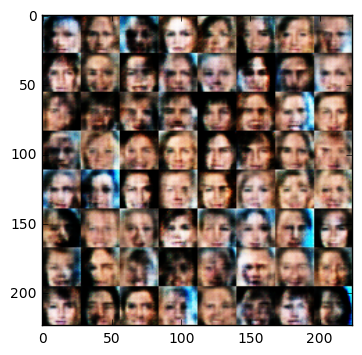

Epoch 1/1... Discriminator Loss: 1.0471... Generator Loss: 0.9843
Epoch 1/1... Discriminator Loss: 1.0314... Generator Loss: 0.8647
Epoch 1/1... Discriminator Loss: 0.4410... Generator Loss: 2.3269
Epoch 1/1... Discriminator Loss: 0.2442... Generator Loss: 1.7792
Epoch 1/1... Discriminator Loss: 1.1707... Generator Loss: 1.2172
Epoch 1/1... Discriminator Loss: 2.1372... Generator Loss: 0.8890
Epoch 1/1... Discriminator Loss: 1.1920... Generator Loss: 1.0457
Epoch 1/1... Discriminator Loss: 1.6524... Generator Loss: 0.4279
Epoch 1/1... Discriminator Loss: 1.2007... Generator Loss: 0.9877
Epoch 1/1... Discriminator Loss: 1.3432... Generator Loss: 0.9368


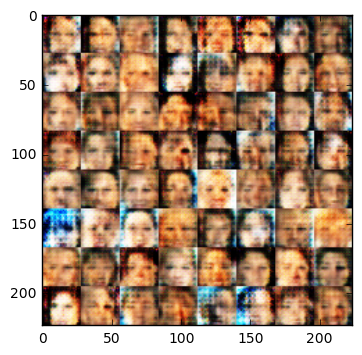

Epoch 1/1... Discriminator Loss: 1.1491... Generator Loss: 0.7939
Epoch 1/1... Discriminator Loss: 1.4512... Generator Loss: 0.8976
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 1.0038
Epoch 1/1... Discriminator Loss: 1.2839... Generator Loss: 0.7541
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 1.0092
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.2977... Generator Loss: 0.6077


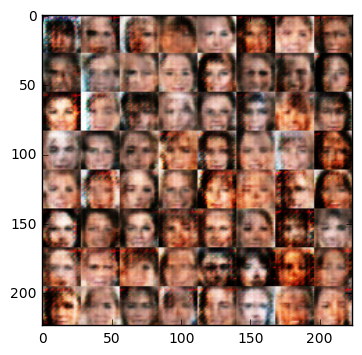

Epoch 1/1... Discriminator Loss: 1.3627... Generator Loss: 0.6339
Epoch 1/1... Discriminator Loss: 1.3606... Generator Loss: 1.0869
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.7186
Epoch 1/1... Discriminator Loss: 1.4137... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.4549... Generator Loss: 0.7752
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.6838
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.8974
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.6290
Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 0.6683


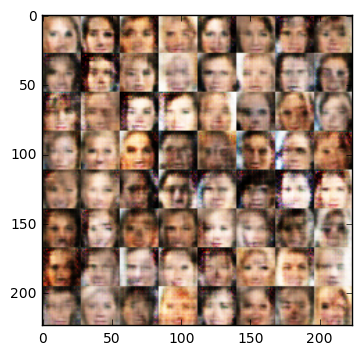

Epoch 1/1... Discriminator Loss: 1.4287... Generator Loss: 0.6267
Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 0.8076
Epoch 1/1... Discriminator Loss: 1.7690... Generator Loss: 0.3637
Epoch 1/1... Discriminator Loss: 1.3792... Generator Loss: 0.6119
Epoch 1/1... Discriminator Loss: 1.4492... Generator Loss: 0.6729
Epoch 1/1... Discriminator Loss: 1.3108... Generator Loss: 0.7714
Epoch 1/1... Discriminator Loss: 1.4296... Generator Loss: 1.0603
Epoch 1/1... Discriminator Loss: 1.3186... Generator Loss: 0.8896
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.7485
Epoch 1/1... Discriminator Loss: 1.2678... Generator Loss: 0.6767


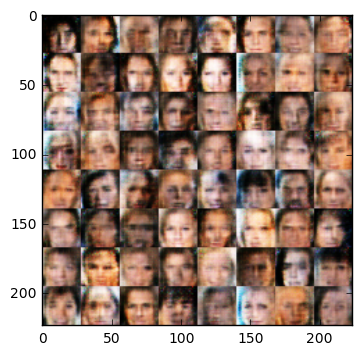

Epoch 1/1... Discriminator Loss: 1.4680... Generator Loss: 0.4400
Epoch 1/1... Discriminator Loss: 1.1733... Generator Loss: 0.7759
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.8357
Epoch 1/1... Discriminator Loss: 1.3645... Generator Loss: 0.8665
Epoch 1/1... Discriminator Loss: 1.3254... Generator Loss: 0.5963
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 0.6034
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.8138
Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 0.7454


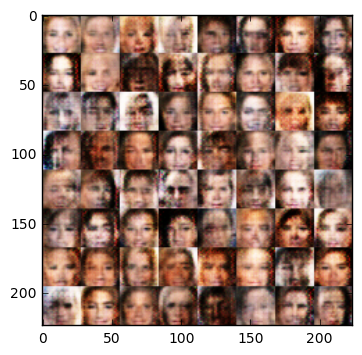

Epoch 1/1... Discriminator Loss: 1.2671... Generator Loss: 0.7228
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.8808
Epoch 1/1... Discriminator Loss: 1.3259... Generator Loss: 0.6241
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.5687
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.7591
Epoch 1/1... Discriminator Loss: 1.1854... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.5819
Epoch 1/1... Discriminator Loss: 1.3581... Generator Loss: 0.9125
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 1.2910


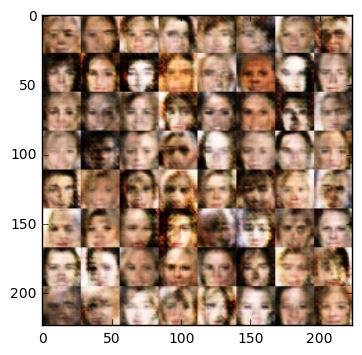

Epoch 1/1... Discriminator Loss: 1.3736... Generator Loss: 0.7653
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.9809
Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 0.6885
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.7906
Epoch 1/1... Discriminator Loss: 1.1817... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.6956
Epoch 1/1... Discriminator Loss: 1.2156... Generator Loss: 0.9247
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.6319


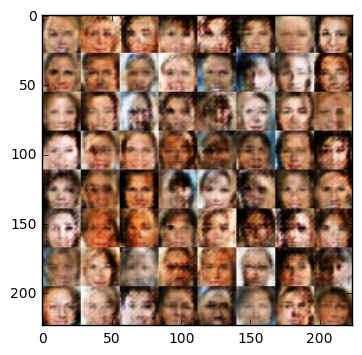

Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.7453
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 1.1053
Epoch 1/1... Discriminator Loss: 1.2742... Generator Loss: 0.7187
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.4783
Epoch 1/1... Discriminator Loss: 1.3063... Generator Loss: 0.7890
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.5377
Epoch 1/1... Discriminator Loss: 1.8304... Generator Loss: 0.2130
Epoch 1/1... Discriminator Loss: 1.6985... Generator Loss: 0.7024
Epoch 1/1... Discriminator Loss: 1.3554... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.3757... Generator Loss: 0.7940


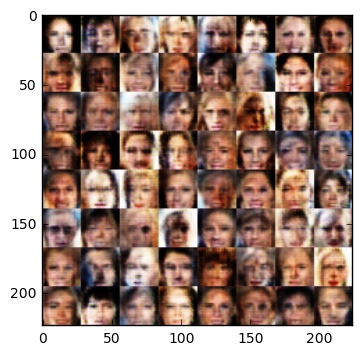

Epoch 1/1... Discriminator Loss: 1.6427... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.2723... Generator Loss: 0.7263
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.5814
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 0.8824
Epoch 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.2443... Generator Loss: 0.8830
Epoch 1/1... Discriminator Loss: 1.6386... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.5318
Epoch 1/1... Discriminator Loss: 0.7243... Generator Loss: 0.8832
Epoch 1/1... Discriminator Loss: 1.4123... Generator Loss: 0.3463


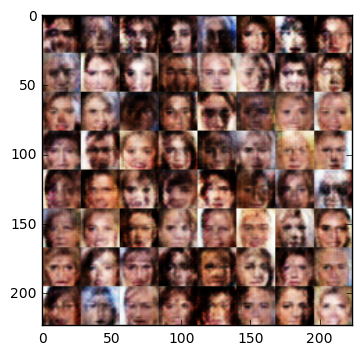

Epoch 1/1... Discriminator Loss: 1.0679... Generator Loss: 0.8086
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 0.9942... Generator Loss: 1.5272
Epoch 1/1... Discriminator Loss: 1.0229... Generator Loss: 1.0879
Epoch 1/1... Discriminator Loss: 0.1794... Generator Loss: 3.3646
Epoch 1/1... Discriminator Loss: 2.3883... Generator Loss: 2.9452
Epoch 1/1... Discriminator Loss: 0.7898... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 0.7173... Generator Loss: 2.0445
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 1.1189
Epoch 1/1... Discriminator Loss: 0.3159... Generator Loss: 1.5393


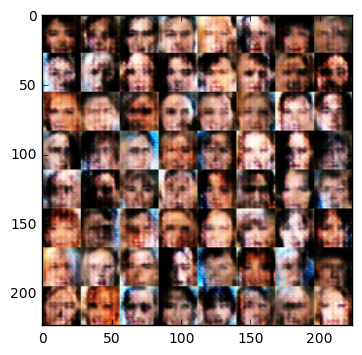

Epoch 1/1... Discriminator Loss: 1.1714... Generator Loss: 0.4998
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.8538
Epoch 1/1... Discriminator Loss: 1.1926... Generator Loss: 0.7635
Epoch 1/1... Discriminator Loss: 1.1299... Generator Loss: 0.9239
Epoch 1/1... Discriminator Loss: 1.2326... Generator Loss: 0.6504
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.8884
Epoch 1/1... Discriminator Loss: 1.4460... Generator Loss: 0.6171
Epoch 1/1... Discriminator Loss: 1.4108... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.6945


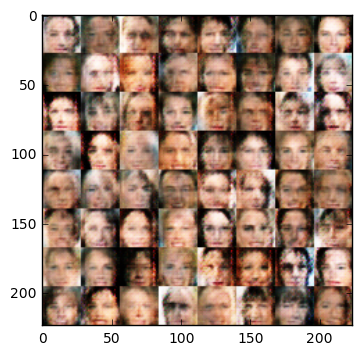

Epoch 1/1... Discriminator Loss: 1.2247... Generator Loss: 0.7413
Epoch 1/1... Discriminator Loss: 1.4274... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.3020... Generator Loss: 0.7483
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.6249
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.7713
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.5371
Epoch 1/1... Discriminator Loss: 1.3218... Generator Loss: 0.6088
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.5922
Epoch 1/1... Discriminator Loss: 1.3269... Generator Loss: 0.7608
Epoch 1/1... Discriminator Loss: 1.3357... Generator Loss: 0.6908


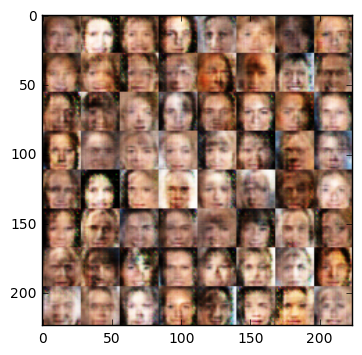

Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.9071
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.7399
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.3486... Generator Loss: 0.7696
Epoch 1/1... Discriminator Loss: 1.3751... Generator Loss: 0.7499
Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.2578... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.4238... Generator Loss: 0.7242
Epoch 1/1... Discriminator Loss: 1.2863... Generator Loss: 0.7420


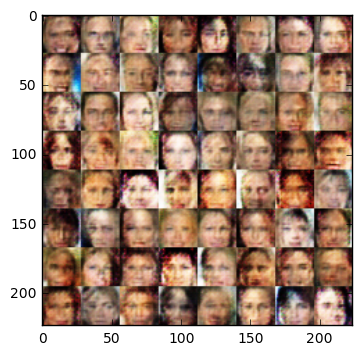

Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.7398
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.4413... Generator Loss: 0.6089
Epoch 1/1... Discriminator Loss: 1.3139... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.6283
Epoch 1/1... Discriminator Loss: 1.2555... Generator Loss: 0.6652
Epoch 1/1... Discriminator Loss: 1.2505... Generator Loss: 0.7147
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 0.7653
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.6949


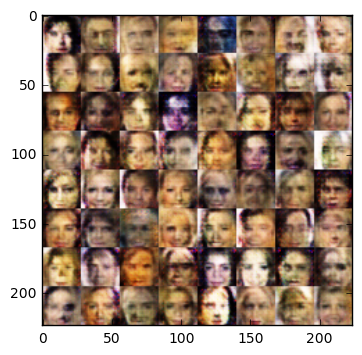

Epoch 1/1... Discriminator Loss: 1.2655... Generator Loss: 0.8717
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.3394... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.6493
Epoch 1/1... Discriminator Loss: 1.3082... Generator Loss: 0.8068
Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.6735
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.6511
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.8979
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.7150


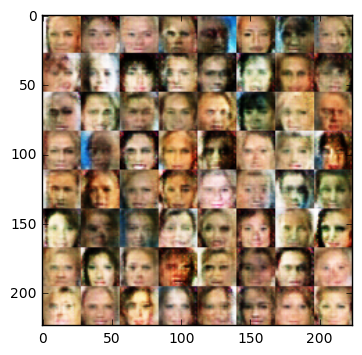

Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.6228
Epoch 1/1... Discriminator Loss: 1.4543... Generator Loss: 0.8314
Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 1.0169
Epoch 1/1... Discriminator Loss: 1.2738... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.5236... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 1.5385... Generator Loss: 0.6902
Epoch 1/1... Discriminator Loss: 1.3034... Generator Loss: 0.9074
Epoch 1/1... Discriminator Loss: 1.3021... Generator Loss: 0.7488
Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 0.6568


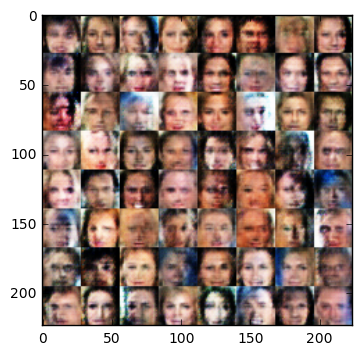

Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.5093... Generator Loss: 0.7890
Epoch 1/1... Discriminator Loss: 0.6345... Generator Loss: 1.1781
Epoch 1/1... Discriminator Loss: 0.6481... Generator Loss: 1.3343
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 2.4018
Epoch 1/1... Discriminator Loss: 0.5318... Generator Loss: 1.0989
Epoch 1/1... Discriminator Loss: 2.1148... Generator Loss: 2.7126
Epoch 1/1... Discriminator Loss: 0.1304... Generator Loss: 2.7579
Epoch 1/1... Discriminator Loss: 2.0661... Generator Loss: 0.8908
Epoch 1/1... Discriminator Loss: 0.5321... Generator Loss: 1.7050


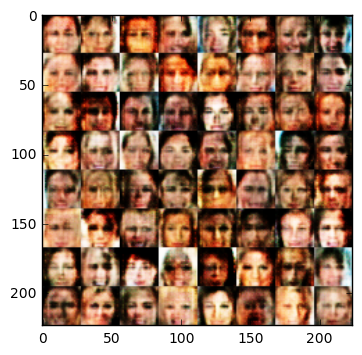

Epoch 1/1... Discriminator Loss: 0.4960... Generator Loss: 1.1717
Epoch 1/1... Discriminator Loss: 0.1078... Generator Loss: 2.6380
Epoch 1/1... Discriminator Loss: 1.7950... Generator Loss: 3.3765
Epoch 1/1... Discriminator Loss: 1.7625... Generator Loss: 1.1798
Epoch 1/1... Discriminator Loss: 0.8270... Generator Loss: 0.8602
Epoch 1/1... Discriminator Loss: 1.7209... Generator Loss: 0.8390
Epoch 1/1... Discriminator Loss: 1.1633... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.8998... Generator Loss: 2.3838
Epoch 1/1... Discriminator Loss: 0.9796... Generator Loss: 1.5984
Epoch 1/1... Discriminator Loss: 0.7975... Generator Loss: 0.7828


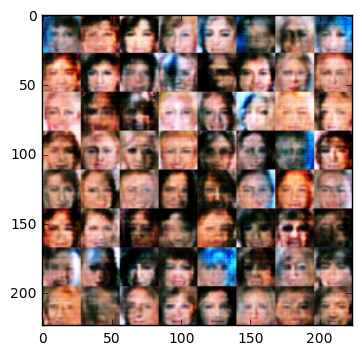

Epoch 1/1... Discriminator Loss: 0.2104... Generator Loss: 2.1335
Epoch 1/1... Discriminator Loss: 0.2152... Generator Loss: 1.8971
Epoch 1/1... Discriminator Loss: 2.4739... Generator Loss: 1.3631
Epoch 1/1... Discriminator Loss: 1.4993... Generator Loss: 1.0256
Epoch 1/1... Discriminator Loss: 1.1659... Generator Loss: 0.7723
Epoch 1/1... Discriminator Loss: 1.2753... Generator Loss: 0.5715


In [17]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.